# Cuauhtemoc 

In [ ]:
cuauhtemoc_data = merged_2023_2024_stations[merged_2023_2024_stations['Alcaldia'] == 'Cuauhtémoc']

# Group by 'Colonia' and count the number of trips
trip_count_per_colonia = cuauhtemoc_data.groupby('Colonia').size().reset_index(name='Trip_Count')

# Group by 'Colonia' and count the number of unique Station_IDs
station_count_per_colonia = cuauhtemoc_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Merge the trip count and station count dataframes
merged_data = trip_count_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by trip count and select the top colonias
merged_data = merged_data.sort_values(by='Trip_Count', ascending=False)

# Create a bar chart for trip counts
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_data['Colonia'],
        y=merged_data['Trip_Count'],
        name='Number of Trips',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=merged_data['Colonia'],
        y=merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Number of Trips and Stations per Colonia in Cuauhtemoc 2023-2024',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Number of Trips',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

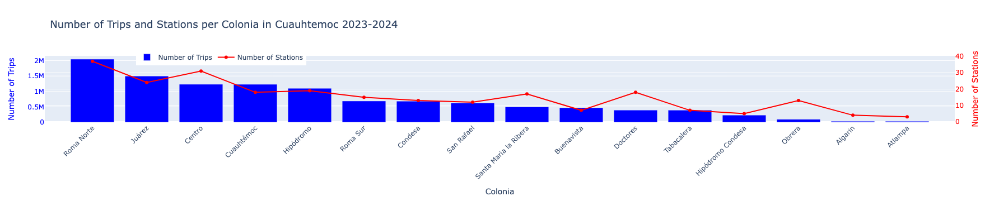

## 3 colonias that stand out that may have too many stations but not very popular for users:
### Centro, Santa maria la ribera, Doctores and obrera
### Roma leads with the most trips and stations 

In [ ]:
# Group by 'Colonia' and calculate the average trip duration
avg_trip_duration_per_colonia = cuauhtemoc_data.groupby('Colonia')['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Group by 'Colonia' and count the number of unique Station_IDs
station_count_per_colonia = cuauhtemoc_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Merge the average trip duration and station count dataframes
merged_data = avg_trip_duration_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by average trip duration
top_10_merged_data = merged_data.sort_values(by='Avg_Trip_Duration', ascending=False).head(10)

# Create a bar chart for average trip duration
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=top_10_merged_data['Colonia'],
        y=top_10_merged_data['Avg_Trip_Duration'],
        name='Average Trip Duration (minutes)',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=top_10_merged_data['Colonia'],
        y=top_10_merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Average Trip Duration and Number of Stations per Colonia in Cuauhtemoc (2023-2024)',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Average Trip Duration (minutes)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

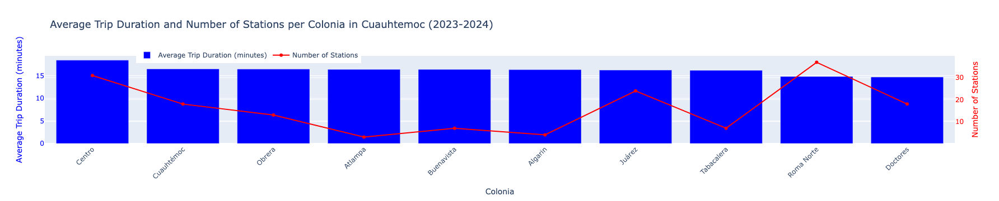

### I susptected other colonias to be in the top for trip duration but cuauhtemoc and centro are very big and busy colonias of the city
### Obrera is a small colonia but is close to centro
### Also, colonia Doctores and obrera and centro are not as safe as other colonias like roma and may not be as bike friendly either in terms of roads, lanes etc

In [ ]:
# Extract coordinates for all unique stations in Benito Juárez
coords = cuauhtemoc_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and calculate the average trip duration for the top 10 stations
avg_trip_duration_per_station = cuauhtemoc_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')
top_10_stations = avg_trip_duration_per_station.sort_values(by='Avg_Trip_Duration', ascending=False).head(10)

# Generate a color map for the top 10 stations
colors = plt.cm.get_cmap('tab10', 10).colors  # 'tab10' is a colormap with 10 colors
color_map = {station: colors[i] for i, station in enumerate(top_10_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 10 stations
mean_lat_lon = top_10_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Miguel Hidalgo Area'
).add_to(mymap)

# Add a marker for each of the top 10 stations with color based on Station_ID
for idx, row in top_10_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Avg Trip Duration: {row['Avg_Trip_Duration']:.2f} minutes",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 60%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 10 station for average Trip Duration in Cuahtemoc</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Add a legend for top 10 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 230px; height: 300px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Stations</b><br>
     '''
for idx, row in top_10_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

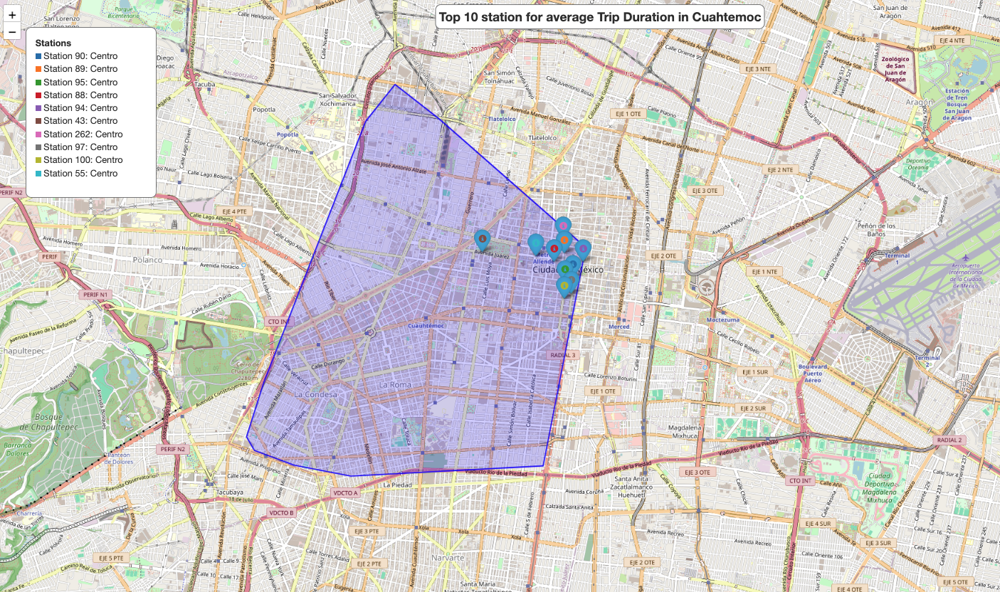

### Top stations for highest trip duartion are all clustered on the top right corner of Cuauhtemoc
### This may indicate high population in centro and commuting to other other areas

In [ ]:
# Group by 'Station_ID' and count the number of trips for the top 10 stations
trip_count_per_station = cuauhtemoc_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')
top_10_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False).head(10)

# Generate a color map for the top 10 stations
colors = plt.cm.get_cmap('tab20', 10).colors  # 'tab20' is a colormap with 20 colors
color_map = {station: colors[i] for i, station in enumerate(top_10_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 10 stations
mean_lat_lon = top_10_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Miguel Hidalgo boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Miguel Hidalgo Area'
).add_to(mymap)

# Add a marker for each of the top 10 stations with color based on Station_ID
for idx, row in top_10_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

    
# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 60%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 10 Stations by Trip Count in Cuahtemoc</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Add a legend for top 10 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 250px; height: 300px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Stations</b><br>
     '''
for idx, row in top_10_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

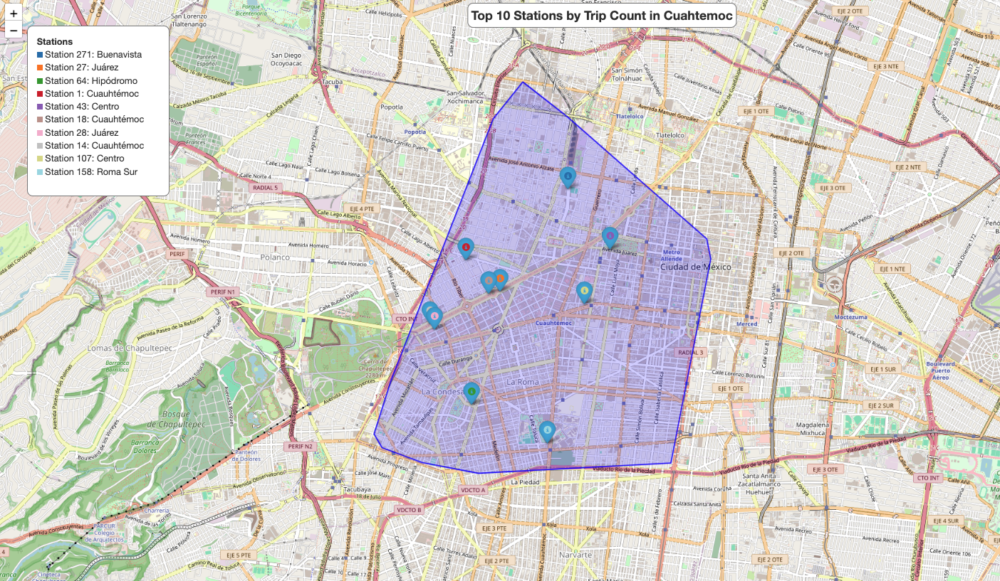

### Top trip counts are not clustered in one area and more evenly distributed thoughout cuauhtemoc
### Most are located on very busy avenues with easy access to different routes
### 5 stations are in colonias that are very close to Polanco which is the busiest colonia of Miguel Hidalgo

In [ ]:
# Group by 'Month' and 'Colonia' and count the number of trips
trip_count_per_month_colonia = cuauhtemoc_data.groupby(['Month', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 10 colonias for each month
top_10_colonias_per_month_count = trip_count_per_month_colonia.groupby('Month').apply(lambda x: x.nlargest(10, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_month_count, x='Month', y='Trip_Count', color='Colonia', barmode='group',
             title='Top 10 Colonias by Number of Trips per Month in Cuautehmoc 2023-2024',
             labels={'Month': 'Month', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show month names
fig.update_xaxes(tickmode='array', tickvals=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                 ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
fig.show()

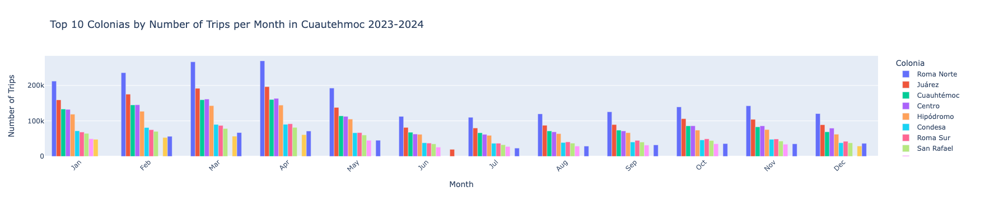

### Monthly data shows January - May are the buseist months 
### Juarez displays the second most busiest colonia
### Colonia Cuahtemoc and centro are usually very close in numbers

In [ ]:
# Group by 'Month' and 'Colonia' and calculate the average trip duration
avg_trip_duration_per_month_colonia = cuauhtemoc_data.groupby(['Month', 'Colonia'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Get the top 10 colonias for each month by average trip duration
top_10_colonias_per_month_duration = avg_trip_duration_per_month_colonia.groupby('Month').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_month_duration, x='Month', y='Avg_Trip_Duration', color='Colonia', barmode='group',
             title='Top 10 Colonias by Average Trip Duration per Month in Cuautehmoc (2023-2024)',
             labels={'Month': 'Month', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show month names
fig.update_xaxes(tickmode='array', tickvals=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                 ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
fig.show()

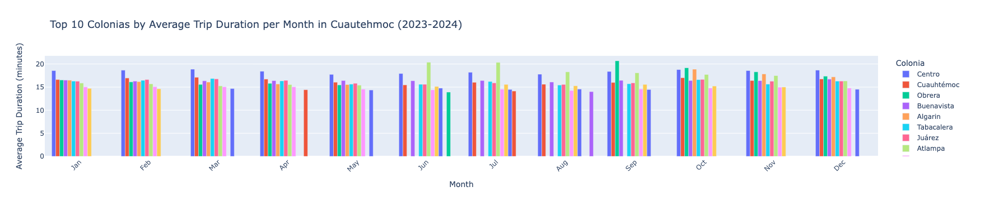

### June, July and August show Atlampa as the leader in trip duration 
### August records Obrera as the top colonia 
### Overal Centro maintains as the most popular colonia for long trip durations 

In [ ]:
# Extract the unique colonias from the top 10 lists
top_colonias_count = top_10_colonias_per_month_count['Colonia'].unique()

# Filter the original data to include only the top colonias
filtered_data_count = cuauhtemoc_data[cuauhtemoc_data['Colonia'].isin(top_colonias_count)]

# Group by 'Colonia' and 'Age_Group' and count the number of trips
trip_count_per_colonia_age_group = filtered_data_count.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Trip_Count')

# Create a bar chart
fig = px.bar(trip_count_per_colonia_age_group, x='Colonia', y='Trip_Count', color='Age_Group', barmode='group',
             title='Trip Counts for Each Age Group in Top Colonias of Cuautehmoc 2023-2024',
             labels={'Colonia': 'Colonia', 'Trip_Count': 'Number of Trips', 'Age_Group': 'Age Group'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

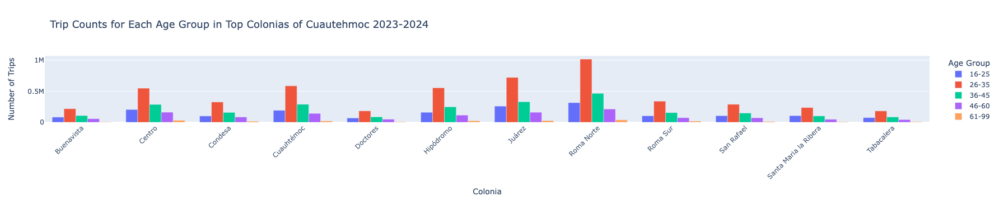

### Roma Norta has the highest trip count for 26-35 age group 
### 16-25 age group surpases 36-45 age group in Santa Maria La Ribera 

In [ ]:
# Extract the unique colonias from the top 10 lists
top_colonias = top_10_colonias_per_month_duration['Colonia'].unique()

# Filter the original data to include only the top colonias
filtered_data = cuauhtemoc_data[cuauhtemoc_data['Colonia'].isin(top_colonias)]

# Group by 'Colonia', 'Age_Group', and 'Month' to calculate the average trip duration for each age group in these colonias
avg_trip_duration_per_colonia_age_group = filtered_data.groupby(['Colonia', 'Age_Group'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Create a bar chart
fig = px.bar(avg_trip_duration_per_colonia_age_group, x='Colonia', y='Avg_Trip_Duration', color='Age_Group', barmode='group',
             title='Average Trip Duration by Age Group in Top Colonias of Cuautehmoc (2023-2024)',
             labels={'Colonia': 'Colonia', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Age_Group': 'Age Group'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

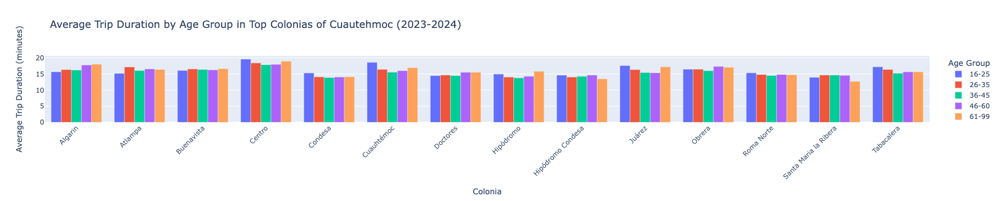

### Trip duration by colonia does not vary much
### Colonia Centro and cuauhtemoc stand out with age group 16-25 leading trip duraion 
### Each age group lead in trip duration in one or multiple colonias except for age group 36-45
### Overall Alcaldia Cuauhtemoc does not highlight a specific age to fully tend to prefer longer rides other than colonia Centro

In [ ]:
# Group by 'Colonia' and 'Gender' and count the number of trips
trip_count_per_colonia_gender = filtered_data_count.groupby(['Colonia', 'Gender']).size().reset_index(name='Trip_Count')

# Create a bar chart
fig = px.bar(trip_count_per_colonia_gender, x='Colonia', y='Trip_Count', color='Gender', barmode='group', color_discrete_map=gender_colors,
             title='Trip Counts for Each Gender in Top Colonias of Cuautehmoc (2023-2024)',
             labels={'Colonia': 'Colonia', 'Trip_Count': 'Number of Trips', 'Gender': 'Gender'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

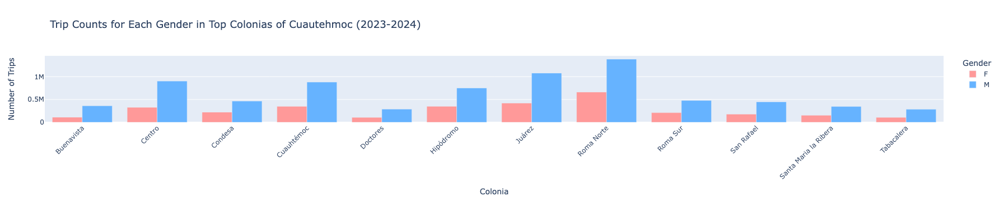

### Males lead by more than double over males for trip counts for each colonia in Cuauhtemoc

In [ ]:
# Group by 'Colonia' and 'Gender' and calculate the average trip duration
avg_trip_duration_per_colonia_gender = filtered_data.groupby(['Colonia', 'Gender'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Create a bar chart
fig = px.bar(avg_trip_duration_per_colonia_gender, x='Colonia', y='Avg_Trip_Duration', color='Gender', barmode='group', color_discrete_map=gender_colors,
             title='Average Trip Duration by Gender in Top Colonias of Cuautehmoc (2023-2024)',
             labels={'Colonia': 'Colonia', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Gender': 'Gender'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

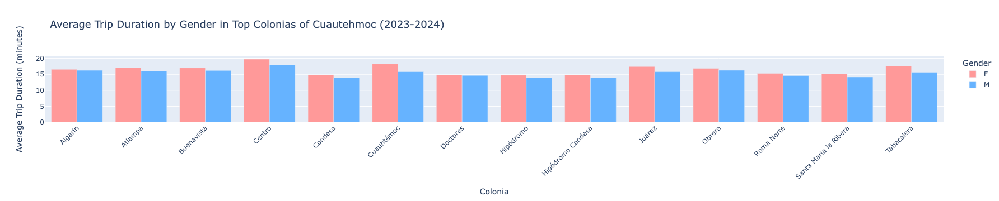

### Females again lead trip duration avgs over males for every colonia in Cuautehmoc

In [ ]:
# Calculate the total number of individuals in each colonia
total_count_per_colonia = cuauhtemoc_data.groupby('Colonia').size().reset_index(name='Total_Count')

# Calculate the number of females in each colonia
female_count_per_colonia = cuauhtemoc_data[cuauhtemoc_data['Gender'] == 'F'].groupby('Colonia').size().reset_index(name='Female_Count')

# Merge the total count and female count dataframes
merged_data = total_count_per_colonia.merge(female_count_per_colonia, on='Colonia')

# Calculate the percentage of females in each colonia
merged_data['Female_Percentage'] = (merged_data['Female_Count'] / merged_data['Total_Count']) * 100

# Sort the data by the percentage of females and select the top 10 colonias
top_10_female_percentage_colonias = merged_data.sort_values(by='Female_Percentage', ascending=False).head(10)

# Create a bar chart for the top 10 colonias with the highest percentage of females
fig = px.bar(top_10_female_percentage_colonias, x='Colonia', y='Female_Percentage', color='Colonia',
             title='Top 10 Colonias in Cuautehmoc with the Highest Percentage of Females',
             labels={'Colonia': 'Colonia', 'Female_Percentage': 'Percentage of Females'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Females',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

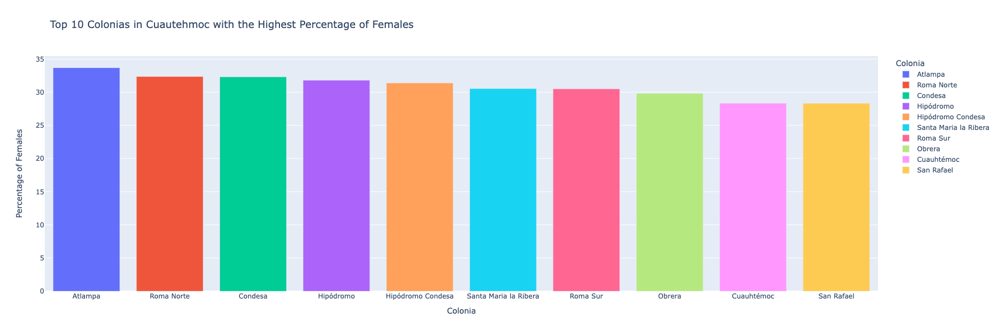

### Colonia atlampa has 33% females for cuauhtemoc 
### Roma norte and condesa has 32% females and hipodromo has 31%

In [ ]:
# Calculate the total number of individuals in each colonia and age group
total_count_per_colonia_age = cuauhtemoc_data.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Total_Count')

# Calculate the number of females in each colonia and age group
female_count_per_colonia_age = cuauhtemoc_data[cuauhtemoc_data['Gender'] == 'F'].groupby(['Colonia', 'Age_Group']).size().reset_index(name='Female_Count')

# Merge the total count and female count dataframes
merged_data_age = total_count_per_colonia_age.merge(female_count_per_colonia_age, on=['Colonia', 'Age_Group'], how='left').fillna(0)

# Calculate the percentage of females in each colonia and age group
merged_data_age['Female_Percentage'] = (merged_data_age['Female_Count'] / merged_data_age['Total_Count']) * 100

# Calculate overall percentage of females in each colonia
overall_female_percentage = merged_data_age.groupby('Colonia')['Female_Count'].sum() / merged_data_age.groupby('Colonia')['Total_Count'].sum() * 100
overall_female_percentage = overall_female_percentage.reset_index(name='Overall_Female_Percentage')

# Merge the overall female percentage with the age group data
merged_data_age = merged_data_age.merge(overall_female_percentage, on='Colonia')

# Sort the data by the overall percentage of females and select the top 10 colonias
top_10_colonias = overall_female_percentage.sort_values(by='Overall_Female_Percentage', ascending=False).head(10)['Colonia']
filtered_data_age = merged_data_age[merged_data_age['Colonia'].isin(top_10_colonias)]

# Create a grouped bar chart for the top 10 colonias with the highest percentage of females by age group
fig = px.bar(filtered_data_age, x='Colonia', y='Female_Percentage', color='Age_Group', barmode='group',
             title='Top 10 Colonias in Cuauhtemoc with the Highest Percentage of Females by Age Group',
             labels={'Colonia': 'Colonia', 'Female_Percentage': 'Percentage of Females'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Females',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

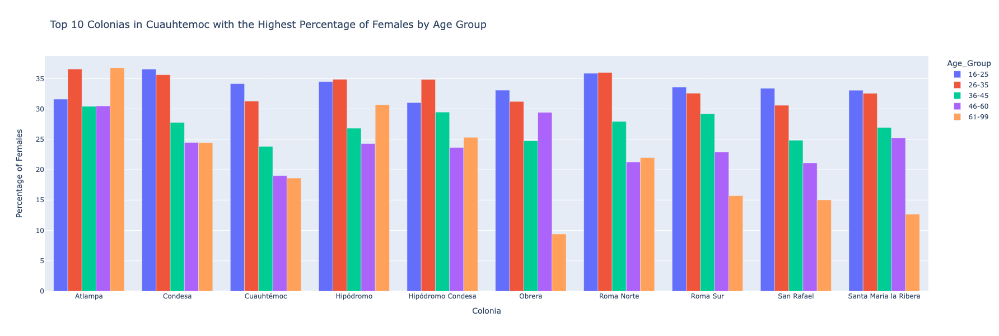

### Out of the 33% of females for colonia atlampa, the majority age croup is 26-35 and 61-99 (36%)
### The rest of the colonias share very cose percentages for age group 16-25 and 26-35
### Obrera has the lowest percentage for 61-99 for females (9%)
### Cuahtemoc has the lowest percentage for females for age group 46-60 out of all other age groups

In [ ]:
# Extract coordinates for all unique stations in Benito Juárez data
coords = cuauhtemoc_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and count the number of trips for all stations
trip_count_per_station = cuauhtemoc_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')
all_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False)

# Generate a color map for the colonias
colonias = all_stations['Colonia'].unique()
colors = plt.cm.get_cmap('tab20', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of all stations
mean_lat_lon = all_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)


# Add a marker for each of the stations with color based on Colonia
for idx, row in all_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)

# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Colonias and Stations for Cuautehmoc</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))    

legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 300px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: 1fr 1fr; gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

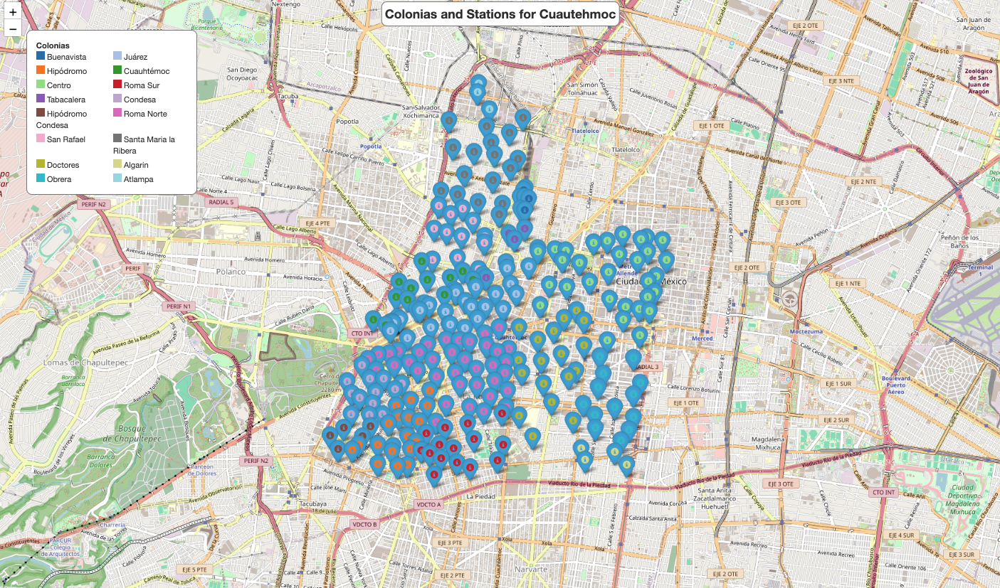

In [ ]:
# Sort the data by the percentage of females and select the top 10 colonias
top_10_female_percentage_colonias = merged_data.sort_values(by='Female_Percentage', ascending=False).head(10)

# Filter the original data to include only the stations in the top colonias
top_colonias = top_10_female_percentage_colonias['Colonia'].unique()
filtered_data = cuauhtemoc_data[cuauhtemoc_data['Colonia'].isin(top_colonias)]

# Extract coordinates for all unique stations in Benito Juárez data
coords = cuauhtemoc_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and count the number of trips for the stations in top colonias
trip_count_per_station = filtered_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')

# Calculate the number of females in each colonia and station
female_count_per_station = filtered_data[filtered_data['Gender'] == 'F'].groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Female_Count')

# Merge trip count and female count dataframes
merged_station_data = trip_count_per_station.merge(female_count_per_station, on=['Station_ID', 'Colonia', 'Latitude', 'Longitude'], how='left').fillna(0)
merged_station_data['Female_Percentage'] = (merged_station_data['Female_Count'] / merged_station_data['Trip_Count']) * 100

# Sort the stations by Female_Percentage and get the top stations
top_stations = merged_station_data.sort_values(by='Female_Percentage', ascending=False).head(20)

# Generate a color map for the colonias (only those present in the filtered data)
colonias = top_stations['Colonia'].unique()
colors = plt.cm.get_cmap('tab20', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top stations
mean_lat_lon = top_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Benito Juárez Area'
).add_to(mymap)

# Add a marker for each of the stations with color based on Colonia
for idx, row in top_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Female Percentage: {row['Female_Percentage']:.2f}%",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)
    
# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top Stations with Highest Female Usage in Cuautehmoc</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Create a legend for the colonias (only those present in the map)
legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 300px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: 1fr 1fr; gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

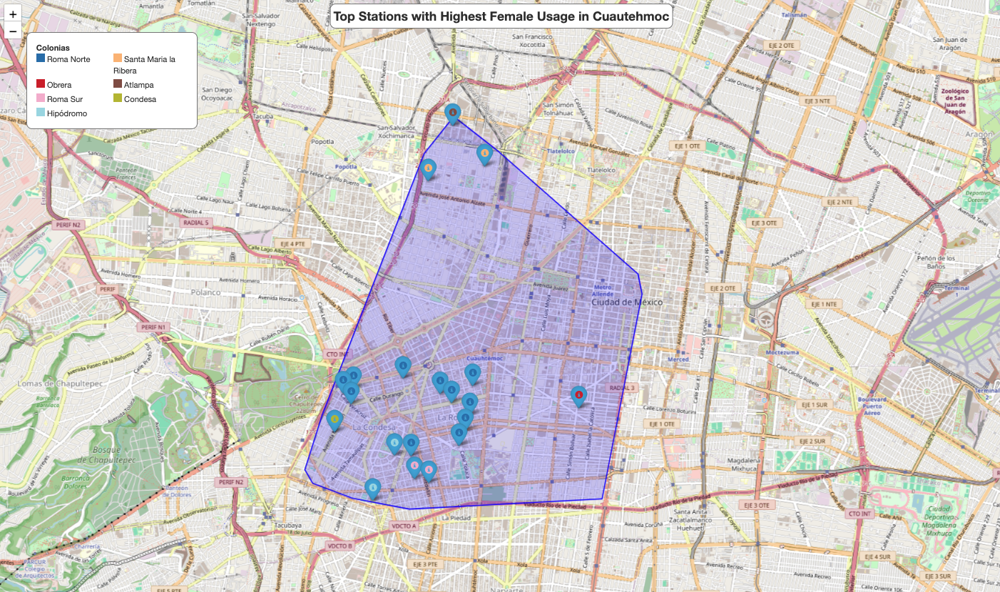

### Comparing the map with all stations with the above which shows high female usage
### It is evident that female activity is found west of cuauhtemoc which is close to alcaldia miguel hidalgo which has polanco and chapultepec
### Colonia obrera also shows high female usage 